In [3]:
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/home/gonzalo/Downloads/ml4cc-general-access_request_pays.json"
os.environ["GS_USER_PROJECT"] = "ml4cc-general"

In [4]:
from ml4floods.data import utils
from ml4floods.visualization import plot_utils
from ml4floods.data.ee_download import process_metadata
import pandas as pd
import matplotlib.pyplot as plt
from itertools import product
import matplotlib.pyplot as plt
from math import ceil

path_to_aois = "gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/"
fs = utils.get_filesystem(path_to_aois)

[Flooding period according to Wikipedia](https://en.wikipedia.org/wiki/2022_Eastern_Australia_floods): 23 February 2022 – 7 April 2022

We divide this period in:
* Flooding period first flood 23rd Feb to 27th March
* Flooding period second flood 28th March 10th April

In [28]:
from datetime import datetime, timedelta

flooding_date_pre = "2022-02-22"
flooding_date_pre_dt =datetime.strptime(flooding_date_pre, "%Y-%m-%d")
flooding_date_first_period_start= "2022-02-23"
flooding_date_first_period_end = "2022-03-15"
flooding_date_first_period_start_dt =datetime.strptime(flooding_date_first_period_start, "%Y-%m-%d")
flooding_date_first_period_end_dt =datetime.strptime(flooding_date_first_period_end, "%Y-%m-%d")

# flooding_date_second_period_start = "2022-03-29"
# flooding_date_second_period_end = "2022-04-10"
# flooding_date_second_period_start_dt = datetime.strptime(flooding_date_second_period_start, "%Y-%m-%d")
# flooding_date_second_period_end_dt = datetime.strptime(flooding_date_second_period_end, "%Y-%m-%d")

# Plot all the predicted floodmaps for a given Area of Interest

First we grab all the predicted geojsons from the Google Bucket

In [20]:
aoi = "AUTOAOI3011" # Lismore AoI
aoi = "AUTOAOI622" # Lismore AoI
# aoi = "QLAOI03" # Cabolture AoI (images out of swath, clouds etc)
# aoi = "QLAOI07"
# aoi = "AUTOAOI144"

aoi_dir = os.path.join(path_to_aois, aoi)

geojsons = [f"gs://{f}" for f in fs.glob(f"{path_to_aois}{aoi}/WF2_unet_rbgiswirs_vec/*/*.geojson")]

# Sort by date (name of the file) and satellite 
def key_sort(x):
    date = os.path.splitext(os.path.basename(x))[0]
    satellite = os.path.basename(os.path.dirname(x))
    # Preference of Sentinel over Landsat
    if satellite == "Landsat":
        append = "B"
    else:
        append = "A"
    return date+append

geojsons.sort(key=key_sort)
geojsons

['gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/Landsat/2022-01-14.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/S2/2022-01-15.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/S2/2022-01-30.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/Landsat/2022-01-30.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/S2/2022-02-09.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/Landsat/2022-02-15.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/S2/2022-02-19.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operational/EMSR570/AUTOAOI622/WF2_unet_rbgiswirs_vec/S2/2022-03-01.geojson',
 'gs://ml4cc_data_lake/0_DEV/1_Staging/operationa

## Plot mean cloud coverage of available S2 and Landsat images

We have downloaded all images which have less than 60% of clouds

In [21]:
metadata_s2 = process_metadata(f"{path_to_aois}{aoi}/S2/s2info.csv")
metadata_l89 = process_metadata(f"{path_to_aois}{aoi}/Landsat/landsatinfo.csv")

metadata_s2["satellite"] = "S2"
metadata_l89["satellite"] = "Landsat"
metadata = pd.concat([metadata_s2, metadata_l89],ignore_index=True)
metadata.cloud_probability*=100
metadata = metadata[metadata["valids"] >= .8]

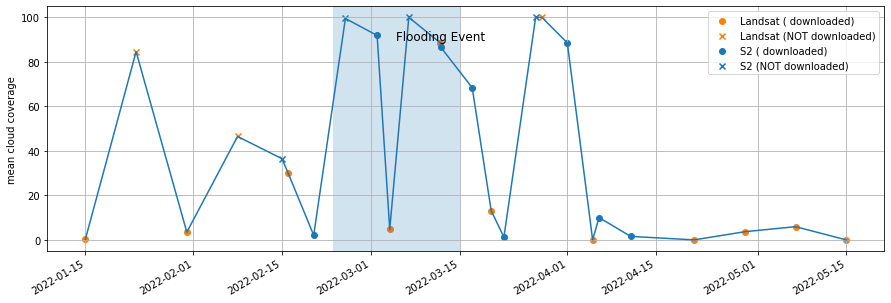

In [22]:

fig, ax = plt.subplots(1,1,figsize=(15,5))

for c,downloaded in product(["Landsat","S2"], [True, False]):
    label=f"{c} ({'' if downloaded else 'NOT'} downloaded)"
    selection_iter = (metadata.satellite == c) & (metadata.s2available == downloaded)
    color = "C0" if c =="S2" else "C1"
    marker = "o" if downloaded else "x"
    ax.scatter(x=metadata[selection_iter].datetime,y=metadata[selection_iter].cloud_probability, 
               label=label,c=color,marker=marker)

ax.legend()
metadata.plot(x="datetime",y="cloud_probability",ax=ax,legend=None)
ax.axvspan(flooding_date_first_period_start_dt, flooding_date_first_period_end_dt, alpha=0.2)
# ax.axvspan(flooding_date_second_period_start_dt, flooding_date_second_period_end_dt, alpha=0.2,color="C2")

ax.text(flooding_date_first_period_start_dt + timedelta(days=10), 90, "Flooding Event", fontsize=12)
# ax.text(flooding_date_second_period_start_dt, 90, "Second Flooding Event", fontsize=12)
# for d in [flooding_date_first_period_start, flooding_date_first_period_end,flooding_date_second_period_start,flooding_date_second_period_end]:
#     plt.vlines(x=datetime.strptime(d,"%Y-%m-%d"),ymin=-1,ymax=101,colors="black",linestyles="dashed")
    
plt.ylabel("mean cloud coverage")
plt.xlabel("")
plt.grid()

## Plot Predicted Floodmaps

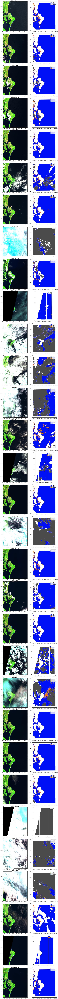

In [23]:
fig, ax =plt.subplots(len(geojsons),2,
                      figsize=(14,len(geojsons)*7),
                      tight_layout=True)

floodmaps = []
for idx,g in enumerate(geojsons):
    date = os.path.splitext(os.path.basename(g))[0]
    satellite_dir = os.path.dirname(g)
    satellite = os.path.basename(satellite_dir)
    aoi_dir = os.path.dirname(os.path.dirname(satellite_dir))
    geotiff = os.path.join(aoi_dir, satellite, f"{date}.tif")
    
    floodmap = utils.read_geojson_from_gcp(g)
    floodmaps.append(floodmap)
    plot_utils.plot_swirnirred_image(geotiff, ax=ax[idx,0], size_read=500, collection_name=satellite)
    plot_utils.plot_floodmap(floodmap, ax=ax[idx,1],legend=True)
    ax[idx,0].set_title(f"{date} {satellite}")

## Plot postflood map

Text(0.5, 1.0, 'Post flood 2022-02-23 2022-03-15')

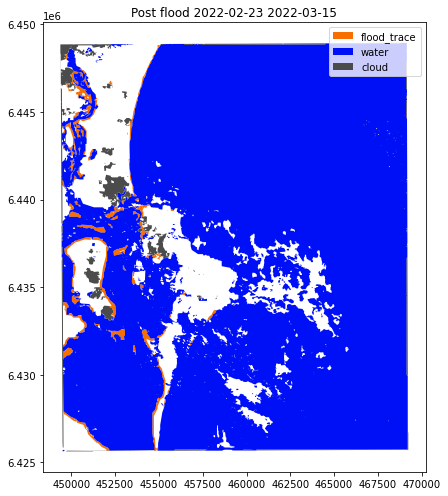

In [32]:
post_flood_path_first_period = os.path.join(aoi_dir, "pre_post_products",
                                            f"postflood_{flooding_date_first_period_start}_{flooding_date_first_period_end}.geojson").replace("\\", "/")

# post_flood_path_second_period = os.path.join(aoi_dir, "pre_post_products",
#                                              f"postflood_{flooding_date_second_period_start}_{flooding_date_second_period_end}.geojson").replace("\\", "/")


fig, ax =plt.subplots(1,1,
                      figsize=(7,7),
                      tight_layout=True)

plot_utils.plot_floodmap(post_flood_path_first_period,ax=ax)
ax.set_title(f"Post flood {flooding_date_first_period_start} {flooding_date_first_period_end}")
# plot_utils.plot_floodmap(post_flood_path_second_period,ax=ax[1])
# ax[1].set_title(f"Second post flood {flooding_date_second_period_start} {flooding_date_second_period_end}")

## Plot pre-flood map

Text(0.5, 1.0, 'Pre-flood water (before 2022-02-22)')

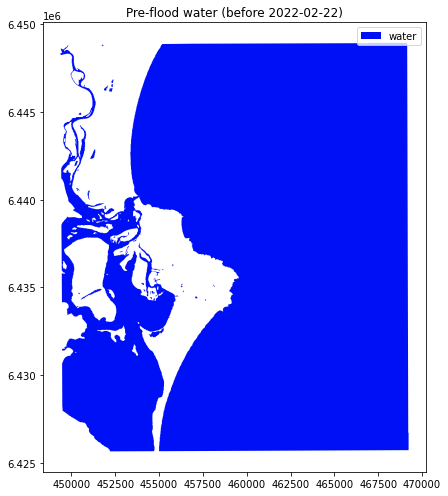

In [33]:
pre_flood_map = os.path.join(aoi_dir, "pre_post_products",
                             f"preflood_{flooding_date_pre}.geojson").replace("\\", "/")

fig, ax =plt.subplots(1,1, figsize=(7,7), tight_layout=True)
plot_utils.plot_floodmap(pre_flood_map,ax=ax)
ax.set_title(f"Pre-flood water (before {flooding_date_pre})")

## Pre-post flood map products

The pre-post flood products are just the difference between the pre-flood and the post-flood maps. We will compute one product for each of the flood periods.

Text(0.5, 1.0, 'Pre-post flood 2022-02-23 2022-03-15')

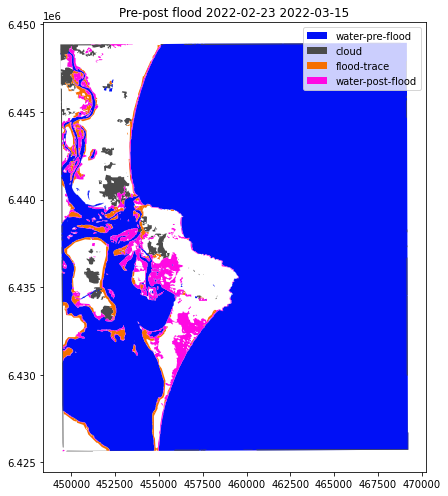

In [34]:
pre_post_flood_path_first_period = os.path.join(aoi_dir, "pre_post_products",
                                                f"prepostflood_{flooding_date_pre}_{flooding_date_first_period_start}_{flooding_date_first_period_end}.geojson").replace("\\", "/")

# pre_post_flood_path_second_period = os.path.join(aoi_dir, "pre_post_products",
#                                              f"prepostflood_{flooding_date_pre}_{flooding_date_second_period_start}_{flooding_date_second_period_end}.geojson").replace("\\", "/")

assert fs.exists(pre_post_flood_path_first_period), "Files do not exist"

fig, ax =plt.subplots(1,1,
                      figsize=(7,7),
                      tight_layout=True)

plot_utils.plot_floodmap(pre_post_flood_path_first_period,ax=ax)
ax.set_title(f"Pre-post flood {flooding_date_first_period_start} {flooding_date_first_period_end}")
# plot_utils.plot_floodmap(pre_post_flood_path_second_period,ax=ax[1])
# ax[1].set_title(f"Second pre-post flood {flooding_date_second_period_start} {flooding_date_second_period_end}")

In [37]:
pre_post_floodmap = utils.read_geojson_from_gcp(pre_post_flood_path_first_period)
pre_post_floodmap["class"].unique()

array(['water-pre-flood', 'area_imaged-pre-flood', 'cloud', 'area_imaged',
       'flood-trace', 'water-post-flood'], dtype=object)

In [38]:
post_floodmap = utils.read_geojson_from_gcp(post_flood_path_first_period)
post_floodmap["class"].unique()

array(['flood_trace', 'water', 'cloud', 'area_imaged'], dtype=object)

In [39]:
pre_floodmap = utils.read_geojson_from_gcp(pre_flood_map)
pre_floodmap["class"].unique()

array(['water', 'area_imaged'], dtype=object)

	There are 1 geoms invalid of 254. These are [97]


<AxesSubplot:>

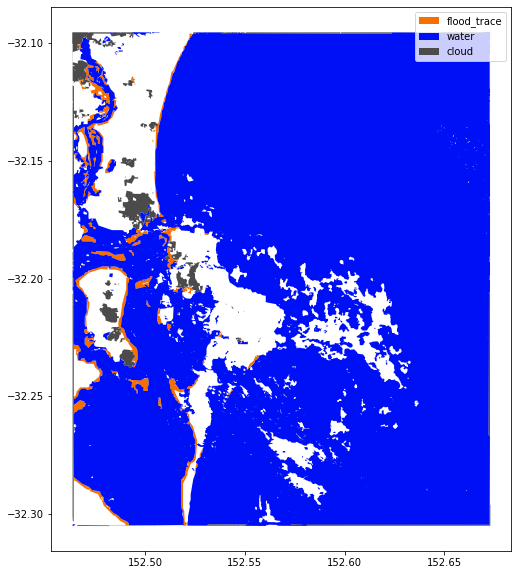

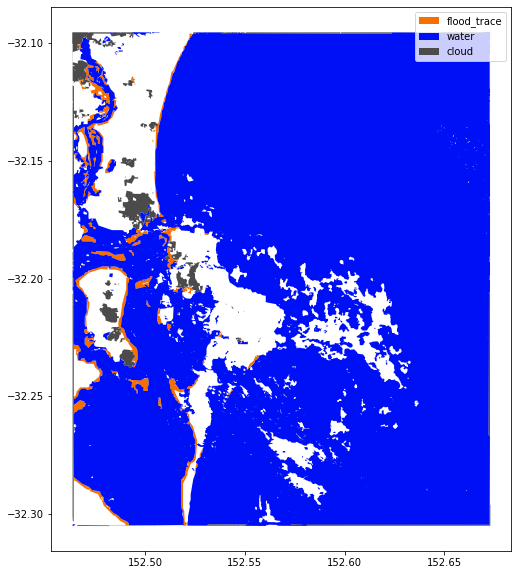

In [89]:
import numpy as np

data = post_floodmap.copy()

is_valid_geoms = data.is_valid
if not is_valid_geoms.all():
    print(f"\tInvalid geometries in CRS {data.crs}")
    data = data[is_valid_geoms]

to_keep = ~data.geometry.isna() & ~data.geometry.is_empty & (data.geometry.area > 10 ** 2)
to_remove = ~to_keep
if to_remove.any():
    print(f"We remove {to_remove.sum()} polygons previously")
    data = data[to_keep]

# data["geometry"] = data["geometry"].simplify(tolerance=10)
data = data.to_crs("EPSG:4326")
plot_utils.plot_floodmap(data)

is_valid_geoms = data.is_valid
if not is_valid_geoms.all():
    idx_bad, = np.where(~is_valid_geoms)
    print(f"\tThere are {(~is_valid_geoms).sum()} geoms invalid of {is_valid_geoms.shape[0]}. These are {idx_bad}")
    # data = data[is_valid_geoms]

plot_utils.plot_floodmap(data)

In [91]:
data.iloc[97:98]

,class,geometry
97,water,"POLYGON ((152.46406 -32.20496, 152.46359 -32.2..."


In [61]:
(post_floodmap.geometry.type == "Polygon").all()

True

In [87]:
post_floodmap.iloc[97:98].area

97    3.642197e+08
dtype: float64

In [88]:
data.iloc[97:98].area

/tmp/ipykernel_30217/444524905.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  data.iloc[97:98].area


98    2.584421e-07
dtype: float64

<AxesSubplot:>

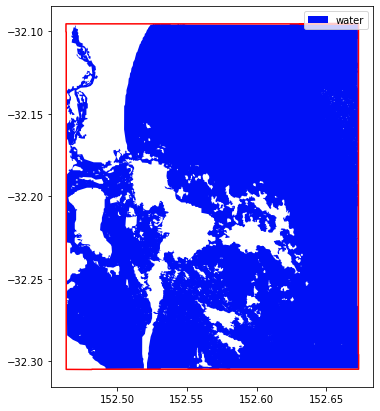

In [90]:
fig, ax = plt.subplots(1,1,figsize=(7,7))

plot_utils.plot_floodmap(data.iloc[97:98],ax=ax)

data.iloc[252:].boundary.plot(ax=ax,color="red")

In [74]:
data.iloc[97:98].area

/tmp/ipykernel_30217/444524905.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  data.iloc[97:98].area


98    2.584421e-07
dtype: float64

In [71]:
data.iloc[[97,252]]

,class,geometry
98,water,"POLYGON ((152.48018 -32.20521, 152.48114 -32.2..."
253,area_imaged,"POLYGON ((152.67297 -32.29588, 152.67318 -32.2..."


In [ ]:
data.buffer()